---
# Create MOM6 bathymetry files for CESM3 LGM
- Author: Jiang Zhu (jiangzhu@ucar.edu)
- Tools used
  - [mom6_bathy](https://ncar.github.io/mom6_bathy/index.html) by Alper Altuntas
- Other references
  - [Notebook](https://github.com/NCAR/tx2_3/tree/main/topography) for preindustrial files by Frank Bryan and Gustavo Marques et al.
    - Including [this notebook](https://github.com/NCAR/tx2_3/blob/main/topography/Append_topo_edits.ipynb) to add additional modifications
  - [MOM6 supergrid](https://mom6.readthedocs.io/en/main/api/generated/pages/Discrete_Grids.html)
---

In [1]:
import datetime

import numpy as np
import hvplot.xarray
import xarray as xr
import matplotlib.pyplot as plt
import xesmf

import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker
import cartopy.feature as cfeature

from mom6_bathy.grid import Grid
from mom6_bathy.topo import Topo

import warnings
warnings.filterwarnings('ignore')

---
## Input

In [2]:
mom_supergird = '/glade/campaign/cesm/cesmdata/inputdata/ocn/mom/tx2_3v2/ocean_hgrid_221123.nc'
mom_topo = '/glade/campaign/cesm/cesmdata/inputdata/ocn/mom/tx2_3v2/ocean_topo_tx2_3v2_240501.nc'
mom_topo_edits = '/glade/campaign/cesm/cesmdata/inputdata/ocn/mom/tx2_3v2/topo_edits_tx2_3v2_250107.nc'

# Used to get the glacier coverage and fill ocean grid points
i6g_21ka = '/glade/campaign/cesm/development/palwg/raw_boundary_data/ice-6g_c/I6_C.VM5a_1deg.21.nc'

# Used only for comparison with the new MOM topo
pop_21ka = '/glade/work/jiangzhu/data/pop_grid_kmt_rmask_gx1v7_21ka.240322.nc'

---
## Output

In [3]:
today = datetime.date.today().strftime("%y%m%d")
print(today)

work_dir = '/glade/work/jiangzhu/data/inputdata/mom/tx2_3v2'
mom_topo_21ka = f"{work_dir}/ocean_topo_tx2_3v2_240501_21ka_{today}.nc"
cice_grid_21ka = f"{work_dir}/cice_grid_tx2_3v2_240501_21ka_{today}.nc"
mom_mesh_21ka = f"{work_dir}/tx2_3v2_ESMFmesh_230415_21ka_{today}.nc"
mom_scrip_21ka = f"{work_dir}/tx2_3v2_SCRIP_230415_21ka_{today}.nc"

250922


---
## Use mom6_bathy to create MOM6 grid/topo objects from the preindustrial files

In [4]:
grid = Grid.from_supergrid(mom_supergird)

topo = Topo.from_topo_file(grid, mom_topo)
topo_min_depth = 2.5

print(topo.min_depth)
print(f"Maximum depth: {topo.depth.max().values}")
print(f"Minimum depth: {topo.depth.min().values}")

depth_old = topo.depth.copy()
depth_old

0.0
Maximum depth: 8128.71923828125
Minimum depth: 0.0


<xarray.DataArray (ny: 480, nx: 540)>
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)
Dimensions without coordinates: ny, nx
Attributes:
    units:    m

In [5]:
ds_mom_grid = grid.tlat.to_dataset(name='lat')
ds_mom_grid['lon'] = grid.tlon
ds_mom_grid

<xarray.Dataset>
Dimensions:  (ny: 480, nx: 540)
Dimensions without coordinates: ny, nx
Data variables:
    lat      (ny, nx) float64 -81.56 -81.56 -81.56 -81.56 ... 50.27 50.11 49.99
    lon      (ny, nx) float64 -286.7 -286.0 -285.3 -284.7 ... 72.97 72.98 73.0

### Apply additional edits
- NOTE: some MOM grid points are edited multiple times

In [6]:
ds_topo_edits = xr.open_dataset(mom_topo_edits)

i = ds_topo_edits["iEdit"].values.astype(int)
j = ds_topo_edits["jEdit"].values.astype(int)
z = ds_topo_edits["zEdit"].values

print(f"depth shape: {depth_old.shape}")
print(f"max iEdit: {i.max()}")
print(f"max jEdit: {j.max()}")
print(f"max zEdit: {ds_topo_edits.zEdit.max().values}")
print(f"min zEdit: {ds_topo_edits.zEdit.min().values}")

arr = depth_old.values.copy()
for jj, ii, zz in zip(j, i, z):
    arr[jj, ii] = zz

topo.depth.data = arr
topo.min_depth = topo_min_depth

depth shape: (480, 540)
max iEdit: 516
max jEdit: 415
max zEdit: 5087.0
min zEdit: 18.76994514465332


In [7]:
depth_prei = topo.depth.copy(deep=True)

### Check results for a specific edit and make plots

In [8]:
k = 100
ii, jj, zz = i[k], j[k], z[k]
z_all = z[(i == ii) & (j == jj)]  # Find all edits for this grid point

print("\nCheck ...")
print(f"MOM index edited: j={jj}, i={ii}")
print(f"All zEdit values for this grid point: {z_all}")
print(f"Final applied value in depth_new: {topo.depth.values[jj, ii]}")
print(f"Original depth_old value: {depth_old.values[jj, ii]}")

p1 = depth_old.hvplot.quadmesh(rasterize=True, cmap="viridis")
p2 = topo.depth.hvplot.quadmesh(rasterize=True, cmap="viridis")
p3 = (topo.depth - depth_old).hvplot.quadmesh(rasterize=True, cmap="BuRd_r")

p1 + p2 + p3


Check ...
MOM index edited: j=258, i=369
All zEdit values for this grid point: [4308.16259766 4454.73144531 4454.73144531]
Final applied value in depth_new: 4454.7314453125
Original depth_old value: 4259.89990234375


:Layout
   .DynamicMap.I   :DynamicMap   []
      :Image   [nx,ny]   (value)
   .DynamicMap.II  :DynamicMap   []
      :Image   [nx,ny]   (value)
   .DynamicMap.III :DynamicMap   []
      :Image   [nx,ny]   (value)

---
## Read and plot mom6 preindustrial topography
- MOM6 ocean_topog uses _real_ depth
- MOM6 ocean_topog uses simple 0-1 land-sea mask with _NO marginal seas_

In [9]:
ds_mom_prei = xr.open_dataset(mom_topo)

ds_mom_prei

<xarray.Dataset>
Dimensions:     (lonh: 540, lath: 480, lonq: 541, latq: 481, nEdits: 25)
Coordinates:
  * lonh        (lonh) float64 -286.7 -286.0 -285.3 -284.7 ... 71.33 72.0 72.67
  * lath        (lath) float64 -81.56 -81.46 -81.36 -81.26 ... 89.33 89.6 89.86
  * lonq        (lonq) float64 -287.0 -286.3 -285.7 -285.0 ... 71.67 72.33 73.0
  * latq        (latq) float64 -81.61 -81.51 -81.41 -81.31 ... 89.46 89.72 89.91
Dimensions without coordinates: nEdits
Data variables: (12/19)
    geolon      (lath, lonh) float64 ...
    geolat      (lath, lonh) float64 ...
    geolonb     (latq, lonq) float64 ...
    geolatb     (latq, lonq) float64 ...
    z           (lath, lonh) float32 ...
    ocn_frac    (lath, lonh) float32 ...
    ...          ...
    orig_mask   (lath, lonh) int32 ...
    D_interp    (lath, lonh) float32 ...
    depth       (lath, lonh) float32 ...
    iEdit       (nEdits) int32 ...
    jEdit       (nEdits) int32 ...
    zEdit       (nEdits) float64 ...
Attributes:
    Description:               Ocean Topography Statistics on MOM6 Grid
    Creator:                   Frank Bryan (bryan@ucar.edu)
    Created:                   20240216
    Generating Code:           create_model_topo.f90
    Model Grid Version:        tx2_3v2
    Source Topography Data:    /glade/campaign/cgd/oce/datasets/obs/SRTM/SRTM...
    Edit History:              Hand Edit + Lake Fill 02/16/2024
    Manual edits updated on::  2024-05-01T15:28:43.496410
    By::                       Gustavo Marques (gmarques@ucar.edu)
    url:                       https://github.com/NCAR/tx2_3/topography/Appen...

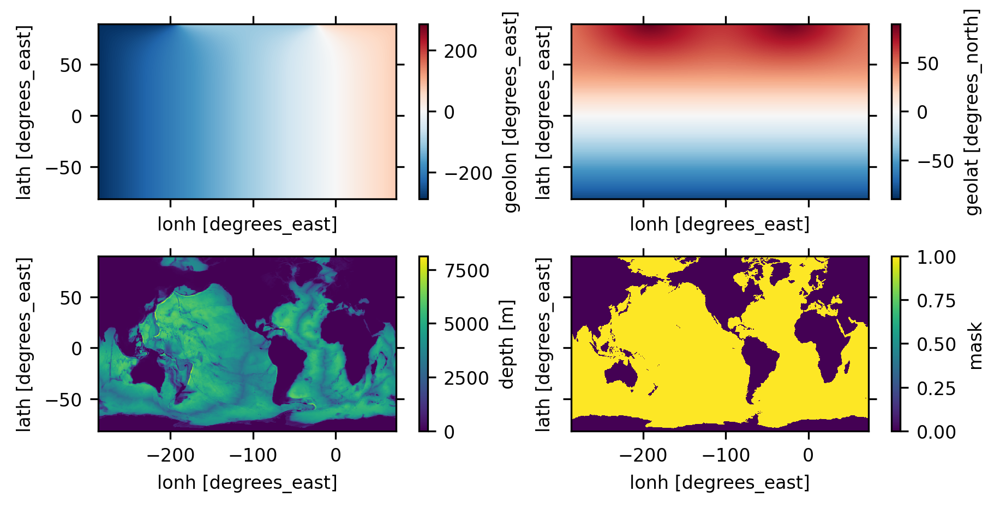

In [10]:
fig, axes = plt.subplots(2, 2, figsize=(6, 3),
                         sharex=True, sharey=True,
                         constrained_layout=True)

for ax, var in zip(axes.ravel(), ['geolon', 'geolat', 'depth', 'mask']):
    ds_mom_prei[var].plot(ax=ax)

---
## Read and plot POP LGM topography
- fixed depth levels (0-60) in POP
- marginal seas in negative index of REGION_MASK

In [11]:
ds_pop_21ka = xr.open_dataset(pop_21ka)
print(f"POP vertical grid in m: {ds_pop_21ka.z_t.values/100}")
ds_pop_21ka

POP vertical grid in m: [5.00000000e+00 1.50000000e+01 2.50000000e+01 3.50000000e+01
 4.50000000e+01 5.50000000e+01 6.50000000e+01 7.50000000e+01
 8.50000000e+01 9.50000000e+01 1.05000000e+02 1.15000000e+02
 1.25000000e+02 1.35000000e+02 1.45000000e+02 1.55000000e+02
 1.65098404e+02 1.75479050e+02 1.86291268e+02 1.97660278e+02
 2.09711379e+02 2.22578285e+02 2.36408829e+02 2.51370163e+02
 2.67654191e+02 2.85483651e+02 3.05119224e+02 3.26867997e+02
 3.51093492e+02 3.78227603e+02 4.08784664e+02 4.43377712e+02
 4.82736729e+02 5.27728001e+02 5.79372891e+02 6.38862622e+02
 7.07563306e+02 7.87002493e+02 8.78825247e+02 9.84705867e+02
 1.10620419e+03 1.24456691e+03 1.40049717e+03 1.57394639e+03
 1.76400324e+03 1.96894419e+03 2.18645653e+03 2.41397155e+03
 2.64900126e+03 2.88938459e+03 3.13340457e+03 3.37979354e+03
 3.62767025e+03 3.87645176e+03 4.12576809e+03 4.37539251e+03
 4.62519029e+03 4.87508346e+03 5.12502805e+03 5.37499982e+03]


<xarray.Dataset>
Dimensions:      (nlat: 384, nlon: 320, z_t: 60, z_w: 60, z_w_bot: 60, nreg: 14)
Coordinates:
    TLAT         (nlat, nlon) float64 ...
    TLONG        (nlat, nlon) float64 ...
    ULAT         (nlat, nlon) float64 ...
    ULONG        (nlat, nlon) float64 ...
  * z_t          (z_t) float64 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
  * z_w          (z_w) float64 0.0 1e+03 2e+03 3e+03 ... 4.75e+05 5e+05 5.25e+05
  * z_w_bot      (z_w_bot) float64 1e+03 2e+03 3e+03 ... 5e+05 5.25e+05 5.5e+05
  * nreg         (nreg) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13
Dimensions without coordinates: nlat, nlon
Data variables:
    DXT          (nlat, nlon) float64 ...
    DYT          (nlat, nlon) float64 ...
    DXU          (nlat, nlon) float64 ...
    DYU          (nlat, nlon) float64 ...
    TAREA        (nlat, nlon) float64 ...
    UAREA        (nlat, nlon) float64 ...
    KMT          (nlat, nlon) int32 ...
    REGION_MASK  (nlat, nlon) int32 ...
    dz           (z_t) float64 ...
    region_name  (nreg) <U21 ...
    region_val   (nreg) int64 ...
Attributes:
    lateral_dims:       [384 320]
    vertical_dims:      60
    vert_grid_file:     gx1v7_vert_grid
    horiz_grid_fname:   inputdata/ocn/pop/gx1v6/grid/horiz_grid_20010402.ieeer8
    topography_fname:   inputdata/ocn/pop/gx1v6/grid/topography_20090204.ieeei4
    region_mask_fname:  inputdata/ocn/pop/gx1v6/grid/region_mask_20090205.ieeei4
    type:               dipole
    title:              POP_gx1v6 grid

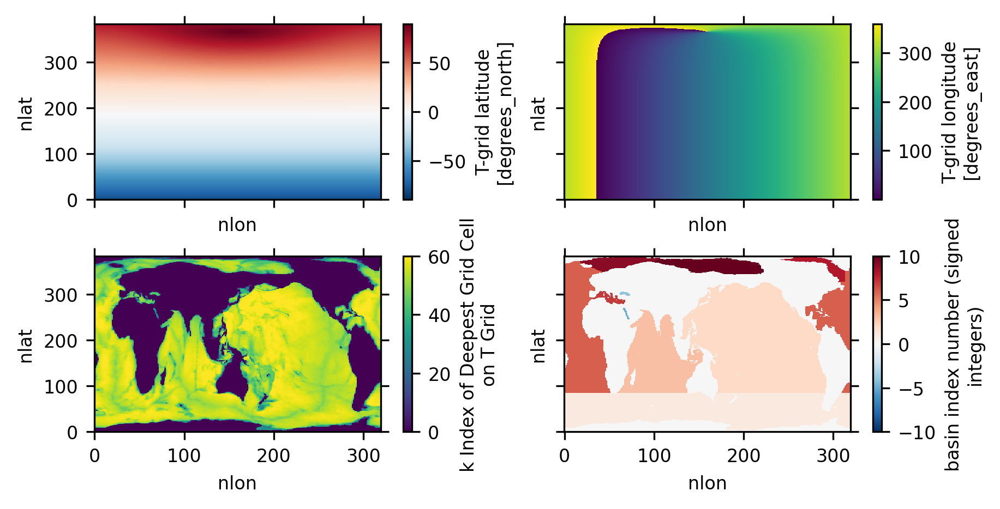

In [12]:
fig, axes = plt.subplots(2, 2, figsize=(6, 3),
                         sharex=True, sharey=True,
                         constrained_layout=True)

for ax, var in zip(axes.ravel(), ['TLAT', 'TLONG', 'KMT', 'REGION_MASK']):
    ds_pop_21ka[var].plot(ax=ax)

---
## Create LGM topo for MOM6 
- Step 1: depth_dSLV --> lower ocean depth by 120 m 
- Step 2: depth_glac --> account for the lgm ice sheets
- Step 3: depth_fill --> run fill_holes to fill "inland" ocean
- Step 4: further modifications: Sea of Japan, Red Sea, Black Sea ...
- Step 5: save a suite of files that requried for setting up CESM3

### Step 1: Lower ocean depth by 120 m

In [13]:
depth_dSLV = depth_prei.copy(deep=True)

dSLV = -120.0
depth_dSLV = depth_dSLV + dSLV
depth_dSLV = xr.where(depth_dSLV >= topo_min_depth, depth_dSLV, 0)
depth_dSLV

<xarray.DataArray (ny: 480, nx: 540)>
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)
Dimensions without coordinates: ny, nx

### Step 2: Fill LGM ocean grid points if covered by ice sheets
- we need to regrid ice-6g to mom grid using xesmf

In [14]:
i6g_ds = xr.open_dataset(i6g_21ka)
i6g_icef = i6g_ds.sftgif
i6g_icef

<xarray.DataArray 'sftgif' (lat: 180, lon: 360)>
[64800 values with dtype=float32]
Coordinates:
  * lat      (lat) float32 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float32 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
Attributes:
    long_name:  Ice area fraction. Time=21 Ka
    units:      %
    time:        21.00 KBP

In [15]:
regridder = xesmf.Regridder(
    i6g_ds, ds_mom_grid, method="bilinear", periodic=True
)

i6g_icef_mom = regridder(i6g_icef)
i6g_icef_mom

<xarray.DataArray (ny: 480, nx: 540)>
array([[100., 100., 100., ..., 100., 100., 100.],
       [100., 100., 100., ..., 100., 100., 100.],
       [100., 100., 100., ..., 100., 100., 100.],
       ...,
       [  0.,   0.,   0., ...,   0.,   0.,   0.],
       [  0.,   0.,   0., ...,   0.,   0.,   0.],
       [  0.,   0.,   0., ...,   0.,   0.,   0.]], dtype=float32)
Dimensions without coordinates: ny, nx
Attributes:
    regrid_method:  bilinear

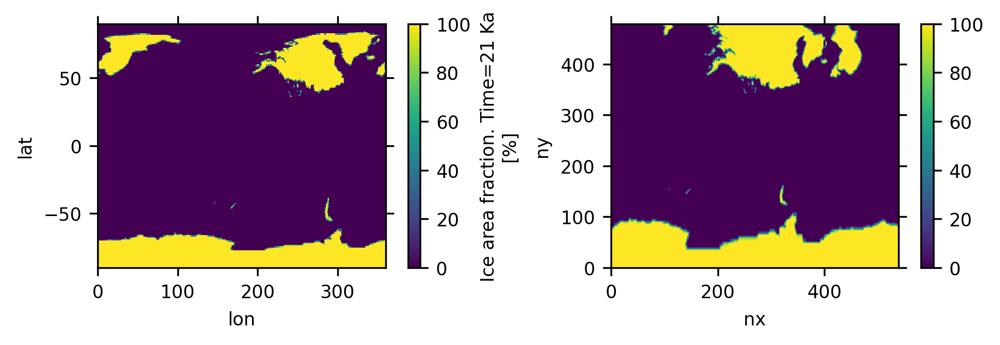

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(6, 2), constrained_layout=True)
i6g_icef.plot(ax=axes[0])
i6g_icef_mom.plot(ax=axes[1])

In [17]:
depth_glac = depth_dSLV.copy(deep=True)
depth_glac = xr.where(i6g_icef_mom > 50., 0, depth_glac)
depth_glac

<xarray.DataArray (ny: 480, nx: 540)>
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)
Dimensions without coordinates: ny, nx

### Step 3: run fill_holes to fill "inland" ocean

In [18]:
def fill_holes(i, j, field, xcyclic=True, tripolar=True):
    """
    An iterative (stack based) implementation of "Ice 9", used to fill holes

    The flood fill starts at [j,i] and treats any positive value of "field" as
    passable. Zero and negative values block flooding.

    xcyclic = True allows cyclic behavior in the last index. (default)
    tripolar = True allows a fold across the top-most edge. (default)
    """

    field_new = field * 0.
    (nj, ni) = field_new.shape
    stack = set()
    stack.add((j, i))

    while stack:
        (j, i) = stack.pop()

        if field_new[j, i] or field[j, i] <= 0:
            continue
        field_new[j, i] = field[j, i]

        if i > 0:
            stack.add((j, i-1))
        elif xcyclic:
            stack.add((j, ni-1))

        if i < ni-1:
            stack.add((j, i+1))
        elif xcyclic:
            stack.add((j, 0))

        if j > 0:
            stack.add((j-1, i))

        if j < nj-1:
            stack.add((j+1, i))
        elif tripolar:
            stack.add((j, ni-1-i))  # Tri-polar fold

    return field_new

In [19]:
%%time

depth_fill = depth_glac.copy(deep=True)

iseed = 5
jseed = 250
print(f"seeding point depth = {depth_glac[jseed, iseed].values}\n")

depth_fill = fill_holes(iseed, jseed, depth_fill)

seeding point depth = 4656.0390625

CPU times: user 29.9 s, sys: 0 ns, total: 29.9 s
Wall time: 29.9 s


### Step 4.0: make plots to examine the results so far
- Prblems: we lost Sea of Japan, Red Sea, and Black Sea due to the "filling" of inland holes
- We need to check important regions such as the Sandal and Sahul shelves

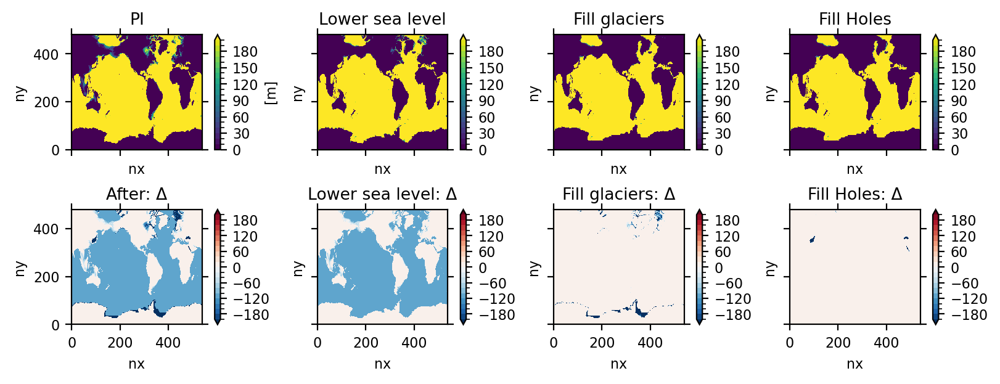

In [20]:
fig, axes = plt.subplots(2, 4, figsize=(8, 3), dpi=200,
                         sharex=True, sharey=True,
                         constrained_layout=True)

for var, title, ax in zip((depth_prei, depth_dSLV,
                           depth_glac, depth_fill),
                          ('PI', 'Lower sea level',
                           'Fill glaciers', 'Fill Holes'),
                          axes.ravel()[0:4]):
    var.plot(ax=ax, levels=np.linspace(0, 200, 21))
    ax.set_title(title)

for var, title, ax in zip((depth_fill - depth_prei,
                           depth_dSLV - depth_prei,
                           depth_glac - depth_dSLV,
                           depth_fill - depth_glac),
                          ('After: Δ',
                           'Lower sea level: Δ',
                           'Fill glaciers: Δ',
                           'Fill Holes: Δ'),
                          axes.ravel()[4:]):
    var.plot(ax=ax, levels=np.linspace(-200, 200, 21),
             extend='both')
    ax.set_title(title)

### Functions used to modify depth and make plots for checking & comparing with POP LGM

In [21]:
def replace_depth_box(depth, depth_to_use, i_bin, j_bin):
    """
    Replace depth in a box (i_bin, j_bin) with depth_to_use
    """
    depth[i_bin[0]:i_bin[1], j_bin[0]:j_bin[1]] = depth_to_use[i_bin[0]:i_bin[1], j_bin[0]:j_bin[1]]


def mom6_latlon2ij(lon2D, lat2D, lon, lat, max_iter=10):
    """
    Find the nearest grid point (i,j) for a given lon/lat in a curvilinear MOM6 grid.
    Handles longitude wrapping.
    """
    ilast = jlast = -1
    jpt = np.abs(lat2D[:, 0]).argmin().values  # start near equator

    n = 0
    while (ilast != jpt and jlast != jpt and n < max_iter):
        lo = 0.
        if lon < lon2D[jpt, :].min(): lo = 360.
        if lon > lon2D[jpt, :].max(): lo = -360.

        ilast, jlast = jpt, jpt
        ipt = np.abs(lon2D[jpt, :] - (lon + lo)).argmin().values
        jpt = np.abs(lat2D[:, ipt] - lat).argmin().values
        n += 1

    return ipt, jpt


def plot_depth(depth1, depth2, ds_mom_prei, ds_pop_21ka,
               lonbeg, lonend, latbeg, latend, skip=5,
               titles=('Preindustrial', 'LGM')):
    """
    Plot two MOM6 depth fields and POP KMT side by side with coastlines,
      curvilinear grids, and optional index annotations.
    """

    geolon, geolat = ds_mom_prei.geolon, ds_mom_prei.geolat
    geolonb, geolatb = ds_mom_prei.geolonb, ds_mom_prei.geolatb

    fig, axes = plt.subplots(1, 3, figsize=(16, 6),
                             constrained_layout=True,
                             sharex=True, sharey=True,
                             subplot_kw={'projection': ccrs.PlateCarree()})
    plt.set_cmap('PuBuGn')

    for depth, ax, title in zip([depth1, depth2], axes[:2], titles):
        nlath, nlonh = depth.shape

        # Determine i,j corners
        ivals = np.array([mom6_latlon2ij(geolon, geolat, lon, lat)
                          for lon, lat in [(lonbeg, latbeg),
                                           (lonend, latbeg),
                                           (lonend, latend),
                                           (lonbeg, latend)]])
        imin, imax = max(ivals[:,0].min()-1, 0), min(ivals[:,0].max()+1, nlonh)
        jmin, jmax = max(ivals[:,1].min()-1, 0), min(ivals[:,1].max()+1, nlath)

        # Handle tripolar/top-boundary case
        if latend > 65:
            imin, imax = 0, nlonh
            jmax = nlath

        # Optional longitude wrapping
        lo = 360. if lonbeg < -180 else 0.

        # Plot depth
        pc = ax.pcolormesh(geolon[jmin:jmax, imin:imax] + lo,
                           geolat[jmin:jmax, imin:imax],
                           depth[jmin:jmax, imin:imax],
                           vmin=0, vmax=300)
        # Contour zero-depth
        ax.contour(geolon[jmin:jmax, imin:imax] + lo,
                   geolat[jmin:jmax, imin:imax],
                   depth[jmin:jmax, imin:imax],
                   levels=[0.5], colors='black', linewidths=1.5, linestyles='dashed')

        ax.set_xlim(lonbeg+lo, lonend+lo)
        ax.set_ylim(latbeg, latend)
        ax.add_feature(cfeature.COASTLINE, color='darkgrey')
        ax.set_title(title)

        # Grid lines
        ax.set_xticks(np.arange(lonbeg+lo, lonend+lo, 5), crs=ccrs.PlateCarree())
        ax.set_yticks(np.arange(latbeg, latend, 5), crs=ccrs.PlateCarree())
        ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
        ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())

        # Plot boundaries
        for i in range(imin, imax):
            ax.plot(geolonb[:, i]+lo, geolatb[:, i], color='grey', linewidth=0.5)
        for j in range(jmin, jmax):
            ax.plot(geolonb[j, :]+lo, geolatb[j, :], color='grey', linewidth=0.5)

        # Optional (i,j) annotations
        for j in range(jmin, jmax, skip):
            for i in range(imin, imax, skip):
                if latbeg < geolat[j, i] < latend and lonbeg+lo < geolon[j, i]+lo < lonend+lo:
                    ax.text(geolon[j, i]+lo, geolat[j, i], f"({j},{i})",
                            ha='center', va='center', fontsize=8)

    # Colorbar for MOM6
    fig.colorbar(pc, ax=axes[:2], shrink=0.5)

    # Plot POP KMT in third panel
    ax = axes[2]
    pop_tlat, pop_tlon = ds_pop_21ka.TLAT, ds_pop_21ka.TLONG
    pop_kmt_box = ds_pop_21ka.KMT.where(
        (pop_tlon > lonbeg+lo) & (pop_tlon < lonend+lo) &
        (pop_tlat > latbeg) & (pop_tlat < latend), drop=True)
    pc = ax.pcolormesh(pop_kmt_box.TLONG, pop_kmt_box.TLAT, pop_kmt_box,
                       vmin=0, vmax=20)
    ax.set_title('POP LGM KMT')
    fig.colorbar(pc, ax=ax, shrink=0.5)

In [22]:
depth_21ka = depth_fill.copy(deep=True)

### Step 4.1: Get back Sea of Japan

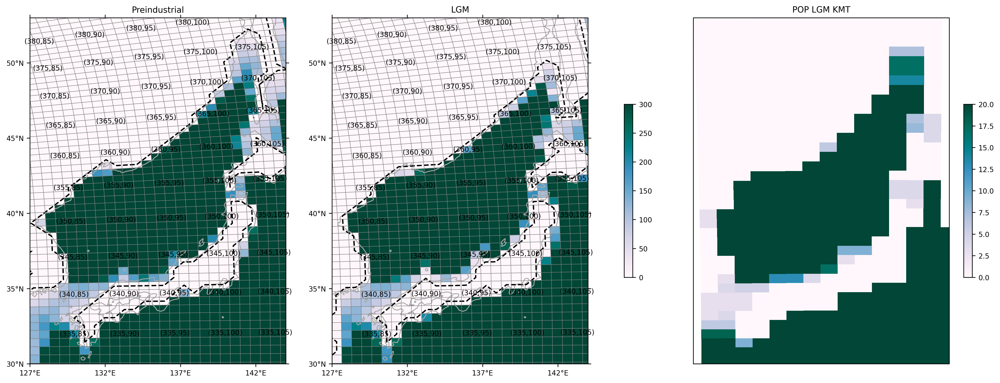

In [23]:
lonbeg = -233
lonend = -216
latbeg = 30
latend = 53

# get back Sea of Japan using values before filling holes
replace_depth_box(depth_21ka, depth_glac, [340, 374], [81, 105])

# get back the south, central, and north channels using preindustrial
replace_depth_box(depth_21ka, depth_prei, [333, 342], [82, 89])
replace_depth_box(depth_21ka, depth_prei, [352, 355], [100, 103])
replace_depth_box(depth_21ka, depth_prei, [361, 364], [103, 107])

plot_depth(depth_prei, depth_21ka,
           ds_mom_prei, ds_pop_21ka,
           lonbeg, lonend, latbeg, latend, skip=5,
           titles=('Preindustrial', 'LGM'))

### Step 4.2: Get back Red Sea

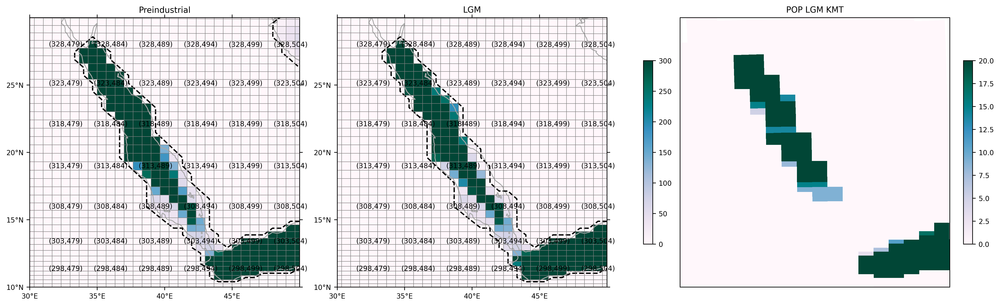

In [24]:
lonbeg = 30
lonend = 50
latbeg = 10
latend = 30

# get back Read Sea using values before filling holes
replace_depth_box(depth_21ka, depth_glac, [303, 333], [475, 495])

# get back the channel using preindustrial
replace_depth_box(depth_21ka, depth_prei, [300, 310], [489, 497])

plot_depth(depth_prei, depth_21ka,
           ds_mom_prei, ds_pop_21ka,
           lonbeg, lonend, latbeg, latend, skip=5,
           titles=('Preindustrial', 'LGM'))

### Step 4.3: Get back Black Sea

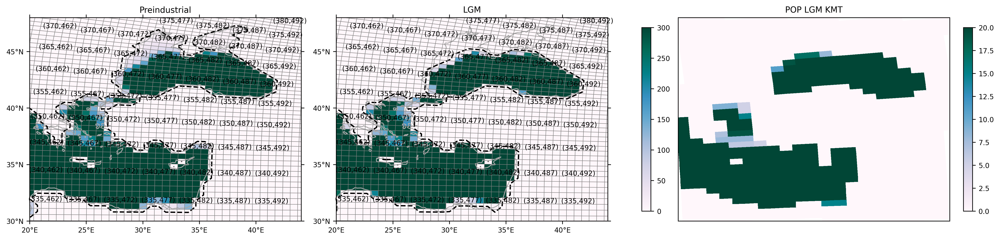

In [25]:
lonbeg = 20
lonend = 44
latbeg = 30
latend = 48

# get back Black Sea using values before filling holes
replace_depth_box(depth_21ka, depth_glac, [350, 375], [467, 498])

# get back the channel using preindustrial
replace_depth_box(depth_21ka, depth_prei, [344, 357], [464, 474])

plot_depth(depth_prei, depth_21ka,
           ds_mom_prei, ds_pop_21ka,
           lonbeg, lonend, latbeg, latend, skip=5,
           titles=('Preindustrial', 'LGM'))

### Step 4.4: examine Sanda and Sahul shelves

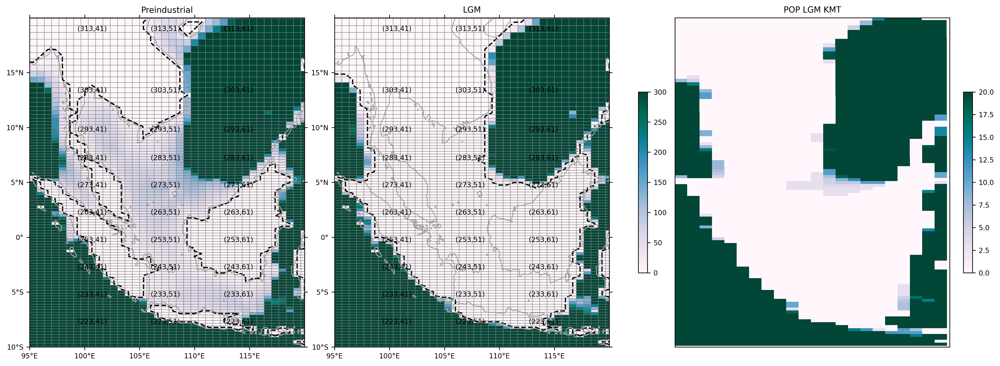

In [26]:
lonbeg = -265
lonend = -240
latbeg = -10
latend = 20

plot_depth(depth_prei, depth_21ka,
           ds_mom_prei, ds_pop_21ka,
           lonbeg, lonend, latbeg, latend, skip=10,
           titles=('Preindustrial', 'LGM'))

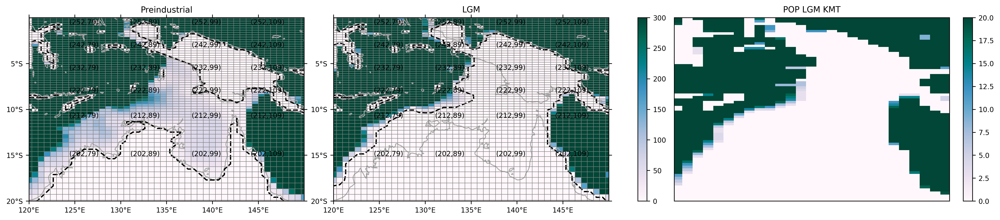

In [27]:
lonbeg = -240
lonend = -210
latbeg = -20
latend = 0

plot_depth(depth_prei, depth_21ka,
           ds_mom_prei, ds_pop_21ka,
           lonbeg, lonend, latbeg, latend, skip=10,
           titles=('Preindustrial', 'LGM'))

### Step 4.5 Check again

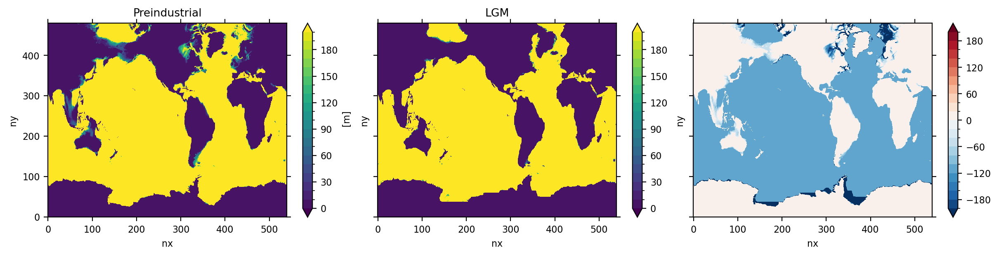

In [28]:
fig, axes = plt.subplots(1, 3, figsize=(12, 3), dpi=200,
                         sharex=True, sharey=True,
                         constrained_layout=True)

for var, title, ax in zip((depth_prei, depth_21ka),
                          ('Preindustrial', 'LGM'),
                          axes):
    var.plot(ax=ax, levels=np.linspace(0, 200, 21),
             extend='both')
    ax.set_title(title)

(depth_21ka - depth_prei).plot.pcolormesh(ax=axes[2],
                                         levels=np.linspace(-200, 200, 21),
                                         cmap='RdBu_r',
                                         extend='both')

### Alternative hvplots

In [29]:
preindustrial_plot = depth_prei.hvplot.quadmesh(
    clim=(0, 200),
    cmap="viridis",
    title="Preindustrial",
    rasterize=True,
    width=800,
    height=600,
)

# LGM
lgm_plot = depth_21ka.hvplot.quadmesh(
    clim=(0, 200),
    cmap="viridis",
    title="LGM",
    rasterize=True,
    width=800,
    height=600,
)

# Difference
diff_plot = (depth_21ka - depth_prei).hvplot.quadmesh(
    clim=(-200, 200),
    cmap="RdBu_r",
    title="Difference (LGM - PI)",
    rasterize=True,
    width=800,
    height=600,
)

# Combine side by side
combined = preindustrial_plot + lgm_plot + diff_plot
combined.opts(shared_axes=True)

:Layout
   .DynamicMap.I   :DynamicMap   []
      :Image   [nx,ny]   (value)
   .DynamicMap.II  :DynamicMap   []
      :Image   [nx,ny]   (value)
   .DynamicMap.III :DynamicMap   []
      :Image   [nx,ny]   (value)

### Step 5: Save a suite of files required for setting up CESM3

In [30]:
%%time

depth_21ka = xr.where(depth_21ka >= topo_min_depth, depth_21ka, 0)
topo.depth = depth_21ka

topo.write_topo(mom_topo_21ka, title='LGM bathymetry file for MOM6 by Jiang Zhu (jiangzhu@ucar.edu; https://github.com/NCAR/paleowg-recipes/cesm3_lgm)')
topo.write_esmf_mesh(mom_mesh_21ka, title='LGM ESMF mesh file for MOM6 by Jiang Zhu (jiangzhu@ucar.edu; https://github.com/NCAR/paleowg-recipes/cesm3_lgm)')
topo.write_scrip_grid(mom_scrip_21ka, title='LGM SCRIP file for MOM6 by Jiang Zhu (jiangzhu@ucar.edu; https://github.com/NCAR/paleowg-recipes/cesm3_lgm)')
topo.write_cice_grid(cice_grid_21ka)

CPU times: user 1.31 s, sys: 47.9 ms, total: 1.35 s
Wall time: 1.49 s
